In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv('rolling_stones_spotify.csv')
df

,Unnamed: 0,name,album,release_date,track_number,id,uri,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,duration_ms
0,0,Concert Intro Music - Live,Licked Live In NYC,2022-06-10,1,2IEkywLJ4ykbhi1yRQvmsT,spotify:track:2IEkywLJ4ykbhi1yRQvmsT,0.0824,0.463,0.993,0.996000,0.9320,-12.913,0.1100,118.001,0.0302,33,48640
1,1,Street Fighting Man - Live,Licked Live In NYC,2022-06-10,2,6GVgVJBKkGJoRfarYRvGTU,spotify:track:6GVgVJBKkGJoRfarYRvGTU,0.4370,0.326,0.965,0.233000,0.9610,-4.803,0.0759,131.455,0.3180,34,253173
2,2,Start Me Up - Live,Licked Live In NYC,2022-06-10,3,1Lu761pZ0dBTGpzxaQoZNW,spotify:track:1Lu761pZ0dBTGpzxaQoZNW,0.4160,0.386,0.969,0.400000,0.9560,-4.936,0.1150,130.066,0.3130,34,263160
3,3,If You Can't Rock Me - Live,Licked Live In NYC,2022-06-10,4,1agTQzOTUnGNggyckEqiDH,spotify:track:1agTQzOTUnGNggyckEqiDH,0.5670,0.369,0.985,0.000107,0.8950,-5.535,0.1930,132.994,0.1470,32,305880
4,4,Don’t Stop - Live,Licked Live In NYC,2022-06-10,5,7piGJR8YndQBQWVXv6KtQw,spotify:track:7piGJR8YndQBQWVXv6KtQw,0.4000,0.303,0.969,0.055900,0.9660,-5.098,0.0930,130.533,0.2060,32,305106
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1605,1605,Carol,The Rolling Stones,1964-04-16,8,08l7M5UpRnffGl0FyuRiQZ,spotify:track:08l7M5UpRnffGl0FyuRiQZ,0.1570,0.466,0.932,0.006170,0.3240,-9.214,0.0429,177.340,0.9670,39,154080
1606,1606,Tell Me,The Rolling Stones,1964-04-16,9,3JZllQBsTM6WwoJdzFDLhx,spotify:track:3JZllQBsTM6WwoJdzFDLhx,0.0576,0.509,0.706,0.000002,0.5160,-9.427,0.0843,122.015,0.4460,36,245266
1607,1607,Can I Get A Witness,The Rolling Stones,1964-04-16,10,0t2qvfSBQ3Y08lzRRoVTdb,spotify:track:0t2qvfSBQ3Y08lzRRoVTdb,0.3710,0.790,0.774,0.000000,0.0669,-7.961,0.0720,97.035,0.8350,30,176080
1608,1608,You Can Make It If You Try,The Rolling Stones,1964-04-16,11,5ivIs5vwSj0RChOIvlY3On,spotify:track:5ivIs5vwSj0RChOIvlY3On,0.2170,0.700,0.546,0.000070,0.1660,-9.567,0.0622,102.634,0.5320,27,121680


In [3]:
df

,Unnamed: 0,name,album,release_date,track_number,id,uri,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,duration_ms
0,0,Concert Intro Music - Live,Licked Live In NYC,2022-06-10,1,2IEkywLJ4ykbhi1yRQvmsT,spotify:track:2IEkywLJ4ykbhi1yRQvmsT,0.0824,0.463,0.993,0.996000,0.9320,-12.913,0.1100,118.001,0.0302,33,48640
1,1,Street Fighting Man - Live,Licked Live In NYC,2022-06-10,2,6GVgVJBKkGJoRfarYRvGTU,spotify:track:6GVgVJBKkGJoRfarYRvGTU,0.4370,0.326,0.965,0.233000,0.9610,-4.803,0.0759,131.455,0.3180,34,253173
2,2,Start Me Up - Live,Licked Live In NYC,2022-06-10,3,1Lu761pZ0dBTGpzxaQoZNW,spotify:track:1Lu761pZ0dBTGpzxaQoZNW,0.4160,0.386,0.969,0.400000,0.9560,-4.936,0.1150,130.066,0.3130,34,263160
3,3,If You Can't Rock Me - Live,Licked Live In NYC,2022-06-10,4,1agTQzOTUnGNggyckEqiDH,spotify:track:1agTQzOTUnGNggyckEqiDH,0.5670,0.369,0.985,0.000107,0.8950,-5.535,0.1930,132.994,0.1470,32,305880
4,4,Don’t Stop - Live,Licked Live In NYC,2022-06-10,5,7piGJR8YndQBQWVXv6KtQw,spotify:track:7piGJR8YndQBQWVXv6KtQw,0.4000,0.303,0.969,0.055900,0.9660,-5.098,0.0930,130.533,0.2060,32,305106
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1605,1605,Carol,The Rolling Stones,1964-04-16,8,08l7M5UpRnffGl0FyuRiQZ,spotify:track:08l7M5UpRnffGl0FyuRiQZ,0.1570,0.466,0.932,0.006170,0.3240,-9.214,0.0429,177.340,0.9670,39,154080
1606,1606,Tell Me,The Rolling Stones,1964-04-16,9,3JZllQBsTM6WwoJdzFDLhx,spotify:track:3JZllQBsTM6WwoJdzFDLhx,0.0576,0.509,0.706,0.000002,0.5160,-9.427,0.0843,122.015,0.4460,36,245266
1607,1607,Can I Get A Witness,The Rolling Stones,1964-04-16,10,0t2qvfSBQ3Y08lzRRoVTdb,spotify:track:0t2qvfSBQ3Y08lzRRoVTdb,0.3710,0.790,0.774,0.000000,0.0669,-7.961,0.0720,97.035,0.8350,30,176080
1608,1608,You Can Make It If You Try,The Rolling Stones,1964-04-16,11,5ivIs5vwSj0RChOIvlY3On,spotify:track:5ivIs5vwSj0RChOIvlY3On,0.2170,0.700,0.546,0.000070,0.1660,-9.567,0.0622,102.634,0.5320,27,121680


In [4]:
# Drop the column 'Unnamed: 0'
df = df.drop(columns=['Unnamed: 0'])

# Verify the column is removed
print(df.head())

                          name               album release_date  track_number  \
0   Concert Intro Music - Live  Licked Live In NYC   2022-06-10             1   
1   Street Fighting Man - Live  Licked Live In NYC   2022-06-10             2   
2           Start Me Up - Live  Licked Live In NYC   2022-06-10             3   
3  If You Can't Rock Me - Live  Licked Live In NYC   2022-06-10             4   
4            Don’t Stop - Live  Licked Live In NYC   2022-06-10             5   

                       id                                   uri  acousticness  \
0  2IEkywLJ4ykbhi1yRQvmsT  spotify:track:2IEkywLJ4ykbhi1yRQvmsT        0.0824   
1  6GVgVJBKkGJoRfarYRvGTU  spotify:track:6GVgVJBKkGJoRfarYRvGTU        0.4370   
2  1Lu761pZ0dBTGpzxaQoZNW  spotify:track:1Lu761pZ0dBTGpzxaQoZNW        0.4160   
3  1agTQzOTUnGNggyckEqiDH  spotify:track:1agTQzOTUnGNggyckEqiDH        0.5670   
4  7piGJR8YndQBQWVXv6KtQw  spotify:track:7piGJR8YndQBQWVXv6KtQw        0.4000   

   danceability  energy  i

In [5]:
missing_values_sum = df.isnull().sum()
print(f"Total missing values: {missing_values_sum}")


Total missing values: name                0
album               0
release_date        0
track_number        0
id                  0
uri                 0
acousticness        0
danceability        0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
duration_ms         0
dtype: int64


In [6]:
df

,name,album,release_date,track_number,id,uri,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,duration_ms
0,Concert Intro Music - Live,Licked Live In NYC,2022-06-10,1,2IEkywLJ4ykbhi1yRQvmsT,spotify:track:2IEkywLJ4ykbhi1yRQvmsT,0.0824,0.463,0.993,0.996000,0.9320,-12.913,0.1100,118.001,0.0302,33,48640
1,Street Fighting Man - Live,Licked Live In NYC,2022-06-10,2,6GVgVJBKkGJoRfarYRvGTU,spotify:track:6GVgVJBKkGJoRfarYRvGTU,0.4370,0.326,0.965,0.233000,0.9610,-4.803,0.0759,131.455,0.3180,34,253173
2,Start Me Up - Live,Licked Live In NYC,2022-06-10,3,1Lu761pZ0dBTGpzxaQoZNW,spotify:track:1Lu761pZ0dBTGpzxaQoZNW,0.4160,0.386,0.969,0.400000,0.9560,-4.936,0.1150,130.066,0.3130,34,263160
3,If You Can't Rock Me - Live,Licked Live In NYC,2022-06-10,4,1agTQzOTUnGNggyckEqiDH,spotify:track:1agTQzOTUnGNggyckEqiDH,0.5670,0.369,0.985,0.000107,0.8950,-5.535,0.1930,132.994,0.1470,32,305880
4,Don’t Stop - Live,Licked Live In NYC,2022-06-10,5,7piGJR8YndQBQWVXv6KtQw,spotify:track:7piGJR8YndQBQWVXv6KtQw,0.4000,0.303,0.969,0.055900,0.9660,-5.098,0.0930,130.533,0.2060,32,305106
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1605,Carol,The Rolling Stones,1964-04-16,8,08l7M5UpRnffGl0FyuRiQZ,spotify:track:08l7M5UpRnffGl0FyuRiQZ,0.1570,0.466,0.932,0.006170,0.3240,-9.214,0.0429,177.340,0.9670,39,154080
1606,Tell Me,The Rolling Stones,1964-04-16,9,3JZllQBsTM6WwoJdzFDLhx,spotify:track:3JZllQBsTM6WwoJdzFDLhx,0.0576,0.509,0.706,0.000002,0.5160,-9.427,0.0843,122.015,0.4460,36,245266
1607,Can I Get A Witness,The Rolling Stones,1964-04-16,10,0t2qvfSBQ3Y08lzRRoVTdb,spotify:track:0t2qvfSBQ3Y08lzRRoVTdb,0.3710,0.790,0.774,0.000000,0.0669,-7.961,0.0720,97.035,0.8350,30,176080
1608,You Can Make It If You Try,The Rolling Stones,1964-04-16,11,5ivIs5vwSj0RChOIvlY3On,spotify:track:5ivIs5vwSj0RChOIvlY3On,0.2170,0.700,0.546,0.000070,0.1660,-9.567,0.0622,102.634,0.5320,27,121680


In [7]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1610 entries, 0 to 1609
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              1610 non-null   object 
 1   album             1610 non-null   object 
 2   release_date      1610 non-null   object 
 3   track_number      1610 non-null   int64  
 4   id                1610 non-null   object 
 5   uri               1610 non-null   object 
 6   acousticness      1610 non-null   float64
 7   danceability      1610 non-null   float64
 8   energy            1610 non-null   float64
 9   instrumentalness  1610 non-null   float64
 10  liveness          1610 non-null   float64
 11  loudness          1610 non-null   float64
 12  speechiness       1610 non-null   float64
 13  tempo             1610 non-null   float64
 14  valence           1610 non-null   float64
 15  popularity        1610 non-null   int64  
 16  duration_ms       1610 non-null   int64  


In [8]:
df['popularity'].describe()

count    1610.000000
mean       20.788199
std        12.426859
min         0.000000
25%        13.000000
50%        20.000000
75%        27.000000
max        80.000000
Name: popularity, dtype: float64

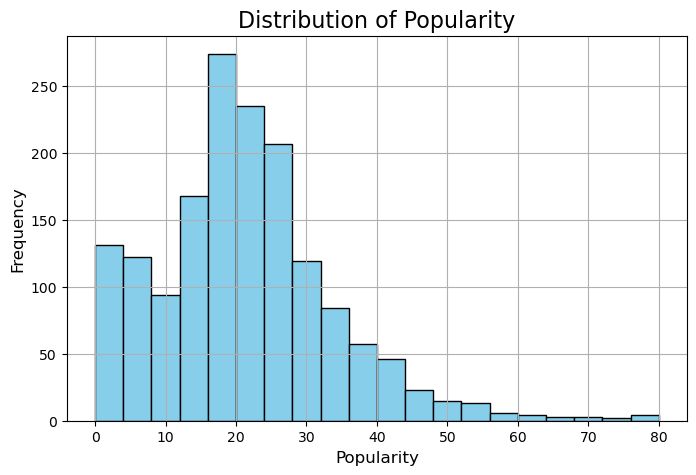

In [77]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
df['popularity'].hist(bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Popularity', fontsize=16)
plt.xlabel('Popularity', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.show()

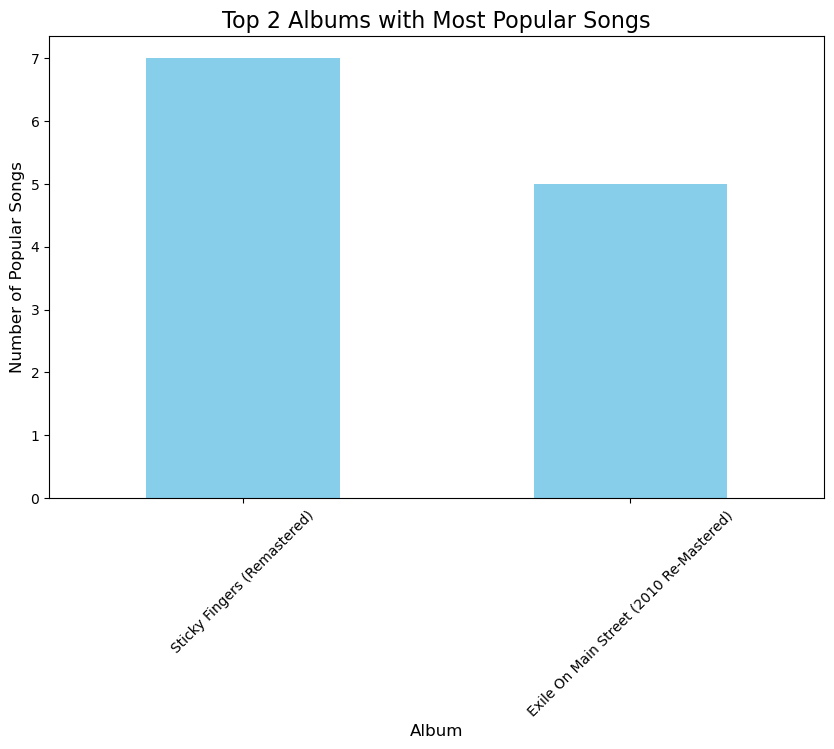

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Define popularity threshold
popularity_threshold = df['popularity'].quantile(0.95)  # 95th percentile
popular_songs = df[df['popularity'] > popularity_threshold]

# Group by album and count popular songs
album_popularity = popular_songs.groupby('album').size().sort_values(ascending=False)

# Get the top 2 albums
top_albums = album_popularity.head(2)

# Plot the results
plt.figure(figsize=(10, 6))
top_albums.plot(kind='bar', color='skyblue')
plt.title('Top 2 Albums with Most Popular Songs', fontsize=16)
plt.xlabel('Album', fontsize=12)
plt.ylabel('Number of Popular Songs', fontsize=12)
plt.xticks(rotation=45)
plt.show()

In [ ]:
df1 = df.copy()


In [ ]:
#df1 = df.drop(columns=['name', 'album' ,'release_date', 'id', 'uri'])

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1610 entries, 0 to 1609
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track_number      1610 non-null   int64  
 1   acousticness      1610 non-null   float64
 2   danceability      1610 non-null   float64
 3   energy            1610 non-null   float64
 4   instrumentalness  1610 non-null   float64
 5   liveness          1610 non-null   float64
 6   loudness          1610 non-null   float64
 7   speechiness       1610 non-null   float64
 8   tempo             1610 non-null   float64
 9   valence           1610 non-null   float64
 10  popularity        1610 non-null   int64  
 11  duration_ms       1610 non-null   int64  
dtypes: float64(9), int64(3)
memory usage: 151.1 KB


In [ ]:
# 2. Check for missing values
print(df1.isnull().sum())

track_number        0
acousticness        0
danceability        0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
duration_ms         0
dtype: int64


/Users/rishabhjain/anaconda3/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/rishabhjain/anaconda3/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/rishabhjain/anaconda3/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/rishabhjain/anaconda3/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na opti

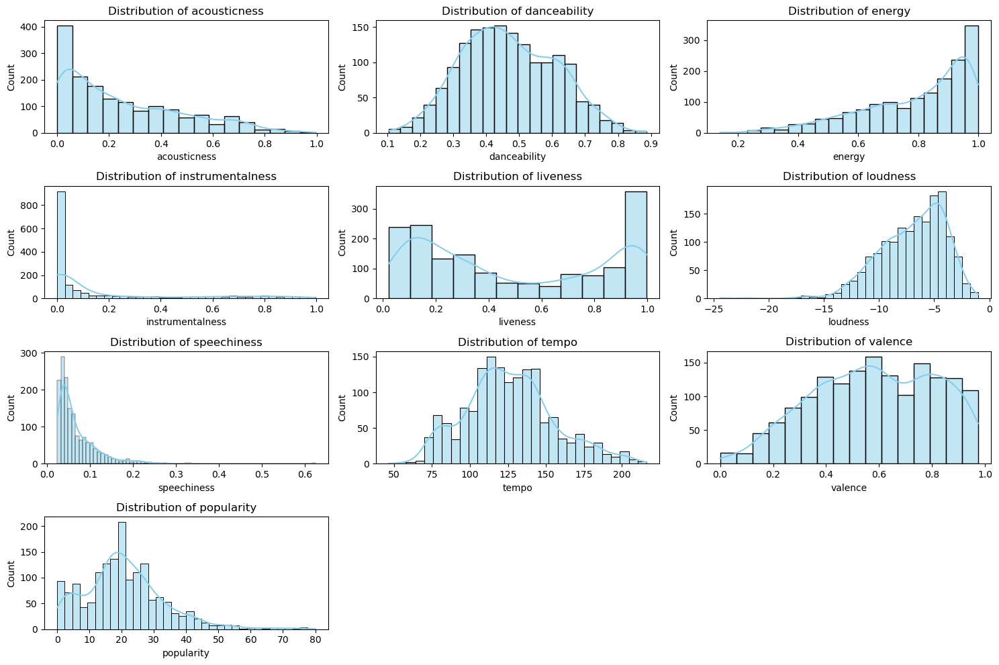

In [ ]:
# 3. Visualize distributions of numerical features
numerical_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 
                      'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'popularity']

plt.figure(figsize=(15, 10))
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(4, 3, i)
    sns.histplot(df1[feature], kde=True, color='skyblue')
    plt.title(f'Distribution of {feature}')
plt.tight_layout()
plt.show()


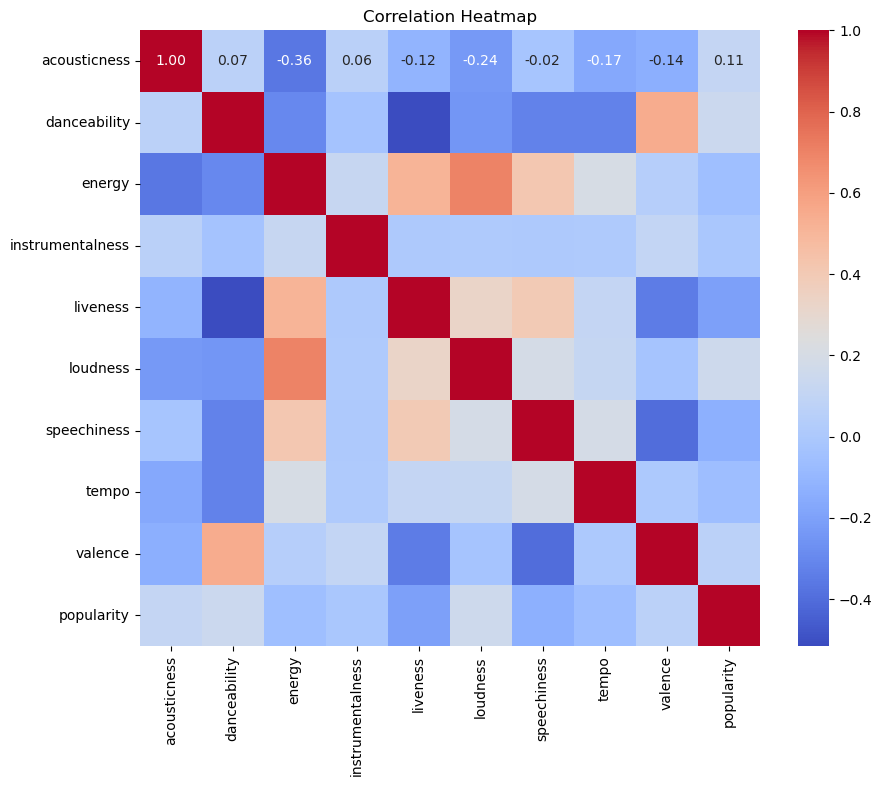

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 4. Correlation heatmap
plt.figure(figsize=(10, 8))
correlation_matrix = df1[numerical_features].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

/var/folders/7b/bbc9hw617_nc4mgs_hvm0v3m0000gn/T/ipykernel_92431/232464908.py:13: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(popular_songs['energy'], label='Popular Songs', shade=True, color='green')
/Users/rishabhjain/anaconda3/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/var/folders/7b/bbc9hw617_nc4mgs_hvm0v3m0000gn/T/ipykernel_92431/232464908.py:14: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(unpopular_songs['energy'], label='Unpopular Songs', shade=True, color='red')
/Users/rishabhjain/anaconda3/anaconda3/lib/python3.11

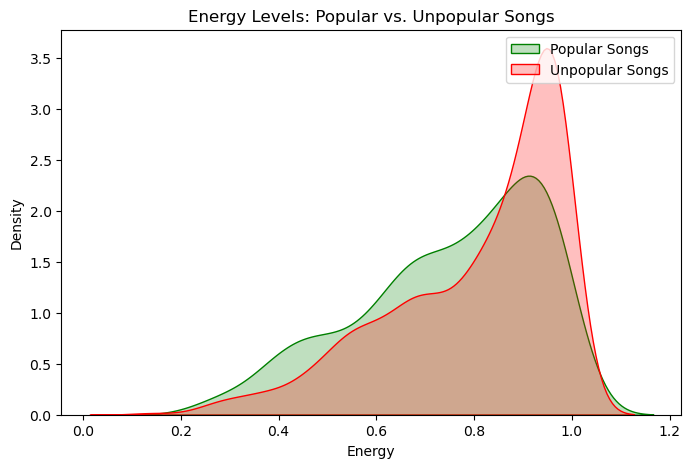

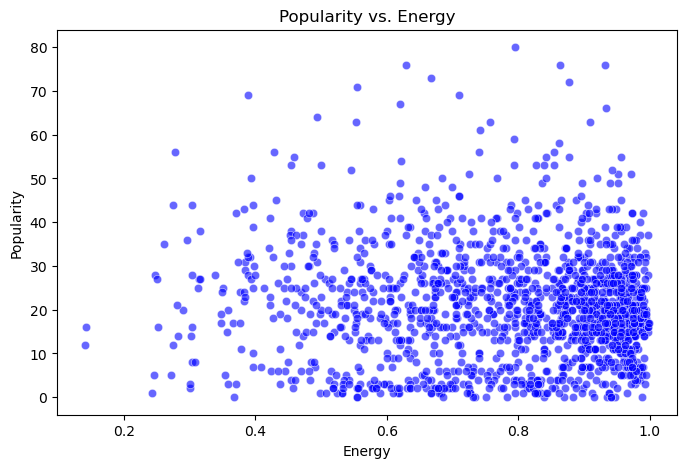

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# 5. Compare popular vs. unpopular songs
popularity_threshold = df1['popularity'].quantile(0.75)
popular_songs = df1[df1['popularity'] > popularity_threshold]
unpopular_songs = df1[df1['popularity'] <= popularity_threshold]

# Example: Compare energy levels
plt.figure(figsize=(8, 5))
sns.kdeplot(popular_songs['energy'], label='Popular Songs', shade=True, color='green')
sns.kdeplot(unpopular_songs['energy'], label='Unpopular Songs', shade=True, color='red')
plt.title('Energy Levels: Popular vs. Unpopular Songs')
plt.xlabel('Energy')
plt.legend()
plt.show()

# 6. Scatter plot: Popularity vs. Energy
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df1, x='energy', y='popularity', alpha=0.6, color='blue')
plt.title('Popularity vs. Energy')
plt.xlabel('Energy')
plt.ylabel('Popularity')
plt.show()

In [78]:
df['release_date'] = pd.to_datetime(df['release_date'])
df.set_index('release_date', inplace=True)


In [15]:
df1 = df.drop(columns=['name', 'album' ,'release_date', 'id', 'uri'])

In [16]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1610 entries, 0 to 1609
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track_number      1610 non-null   int64  
 1   acousticness      1610 non-null   float64
 2   danceability      1610 non-null   float64
 3   energy            1610 non-null   float64
 4   instrumentalness  1610 non-null   float64
 5   liveness          1610 non-null   float64
 6   loudness          1610 non-null   float64
 7   speechiness       1610 non-null   float64
 8   tempo             1610 non-null   float64
 9   valence           1610 non-null   float64
 10  popularity        1610 non-null   int64  
 11  duration_ms       1610 non-null   int64  
 12  year              1610 non-null   int32  
dtypes: float64(9), int32(1), int64(3)
memory usage: 157.4 KB


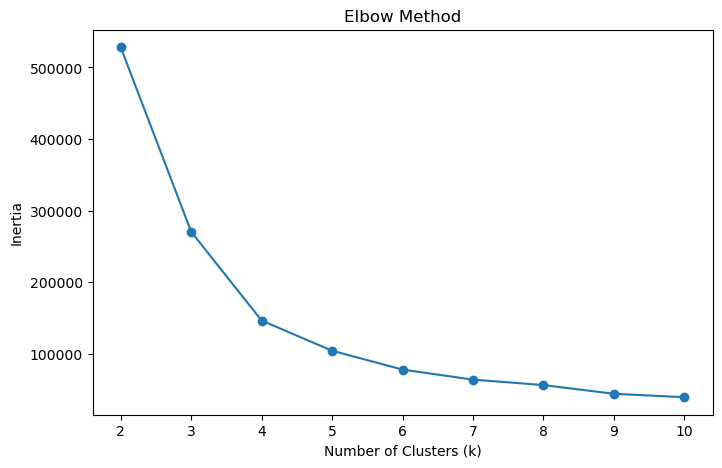

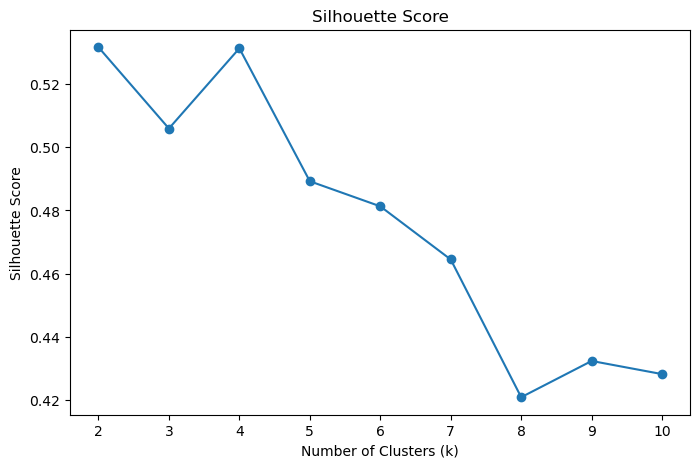

In [44]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# Assuming you have a feature matrix X

# Run K-means algorithm for different values of k
k_values = range(2, 11)
inertia_values = []
silhouette_scores = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X)
    inertia_values.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X, kmeans.labels_))

# Plot the elbow method
plt.figure(figsize=(8, 5))
plt.plot(k_values, inertia_values, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()

# Plot the silhouette scores
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')
plt.show()


In [61]:
from sklearn.cluster import KMeans

# Assuming you have a feature matrix X
k = 4
model = KMeans(n_clusters=k, n_init = 10, init = 'k-means++', random_state=0)
y_pred = kmeans.fit_predict(X)

#get cluster centers
centers = kmeans.cluster_centers_

In [62]:
y_pred

array([0, 3, 3, ..., 2, 0, 0], dtype=int32)

In [72]:
df_filtered = df1.drop(['track_number', 'year', 'popularity', 'duration_ms'], axis=1)

In [73]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1610 entries, 0 to 1609
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   acousticness      1610 non-null   float64
 1   danceability      1610 non-null   float64
 2   energy            1610 non-null   float64
 3   instrumentalness  1610 non-null   float64
 4   liveness          1610 non-null   float64
 5   loudness          1610 non-null   float64
 6   speechiness       1610 non-null   float64
 7   tempo             1610 non-null   float64
 8   valence           1610 non-null   float64
dtypes: float64(9)
memory usage: 113.3 KB


In [74]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_filtered)

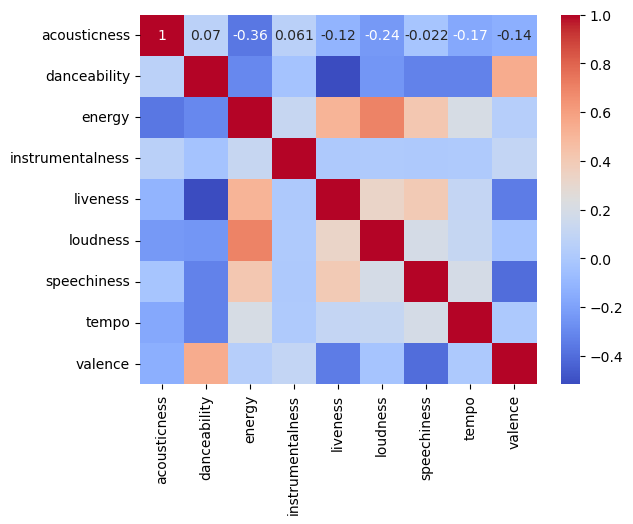

In [75]:
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = df_filtered.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

In [81]:
from sklearn.preprocessing import StandardScaler

# Select relevant features (drop 'popularity' if not needed)
numerical_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 
                      'liveness', 'loudness', 'speechiness', 'tempo', 'valence']
X = df_filtered[numerical_features]

# Normalize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [85]:
from sklearn.cluster import KMeans

# Assuming you have a feature matrix X
k = 4
model = KMeans(n_clusters=k, n_init = 10, init = 'k-means++', random_state=0)
y_pred = kmeans.fit_predict(X_scaled)

#get cluster centers
centers = kmeans.cluster_centers_

In [86]:
df_filtered['Cluster'] = y_pred

In [87]:
y_pred

array([2, 3, 3, ..., 0, 1, 0], dtype=int32)

In [88]:
cluster_summary = df_filtered.groupby('Cluster').mean()
print(cluster_summary)

         acousticness  danceability    energy  instrumentalness  liveness  \
Cluster                                                                     
0            0.162356      0.546517  0.827142          0.054973  0.326251   
1            0.432027      0.499953  0.561159          0.067292  0.291468   
2            0.254519      0.516104  0.820124          0.741067  0.402861   
3            0.192855      0.351109  0.928831          0.129756  0.843017   

         loudness  speechiness       tempo   valence  
Cluster                                               
0       -6.425866     0.051092  123.288579  0.757535  
1       -9.847485     0.046964  114.756045  0.484831  
2       -6.901570     0.049943  122.990668  0.740467  
3       -5.280640     0.112451  138.823669  0.427917  


In [94]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(font_scale=1.5)
sns.pairplot(df_filtered, hue='Cluster', palette='viridis', diag_kind='kde', height=10)
plt.show()

/Users/rishabhjain/anaconda3/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/rishabhjain/anaconda3/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/rishabhjain/anaconda3/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/rishabhjain/anaconda3/anaconda3/lib/python3.11/site-packages/seaborn/_old

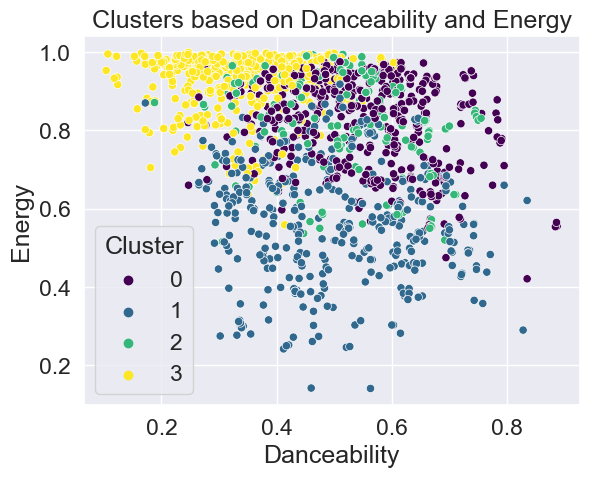

In [95]:
sns.scatterplot(data=df_filtered, x='danceability', y='energy', hue='Cluster', palette='viridis')
plt.title('Clusters based on Danceability and Energy')
plt.xlabel('Danceability')
plt.ylabel('Energy')
plt.show()

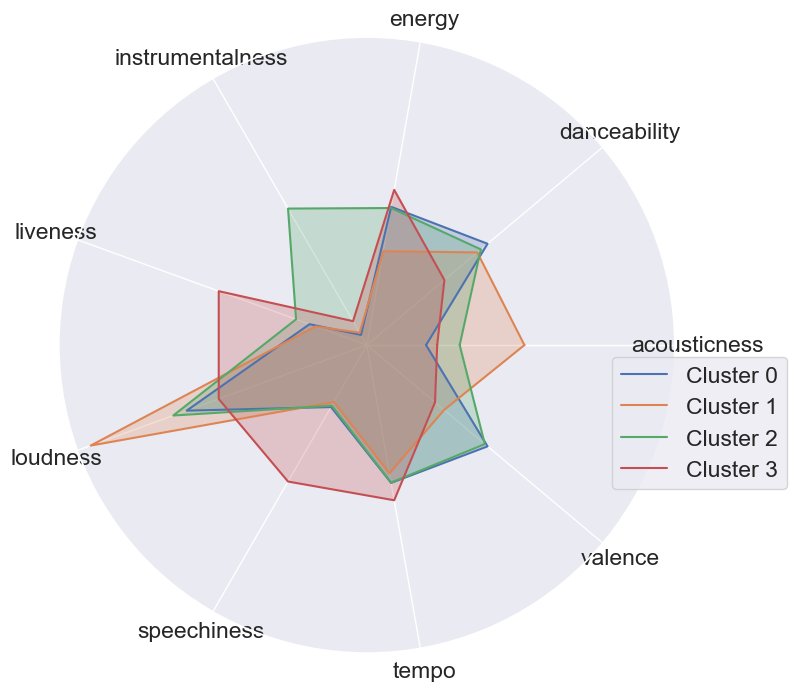

In [97]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Normalize cluster summary for radar chart
cluster_summary_normalized = cluster_summary / cluster_summary.max()

# Radar chart
labels = cluster_summary_normalized.columns
num_vars = len(labels)

angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

for i, row in cluster_summary_normalized.iterrows():
    data = row.tolist()
    data += data[:1]
    ax.plot(angles, data, label=f'Cluster {i}')
    ax.fill(angles, data, alpha=0.25)

ax.set_yticks([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)
ax.legend(bbox_to_anchor=(1.2, 0.5))
